<!-- Google Fonts pour Montserrat et Lato -->
<link href="https://fonts.googleapis.com/css?family=Lato:400,700|Montserrat:700&display=swap" rel="stylesheet">

<div style="
    font-family: 'Lato', 'Segoe UI', Arial, sans-serif;
    color: #2c2c2c;
    text-align: center;
    padding: 28px 0 34px 0;
    background: #fff;
">

  <h2 style="
      font-family: 'Montserrat', 'Lato', Arial, sans-serif;
      font-size: 28px;
      color: #c2185b;
      font-weight: bold;
      letter-spacing: 1px;
      border-bottom: 2.5px solid #f8bbd0;
      padding-bottom: 8px;
      margin: 0 auto 16px auto;
      width: fit-content;
      min-width: 320px;
      background: linear-gradient(to right, #fce4ec 80%, #fff 100%);
      border-radius: 8px 8px 0 0;
      box-shadow: 0 2px 6px rgba(194,24,91,0.04);
  ">
    Bias Correction of Climate Projection Data
  </h2>

  <p style="font-size: 16px; margin: 10px 0 3px 0; letter-spacing: 0.4px;">
    <strong>Hajar BADRAOUI</strong> — Data Analyst Intern, <span style="color:#ad1457">ARVALIS</span> (2025)
  </p>

  <p style="font-size: 15px; margin: 2px 0;">
    M2 — Statistiques Appliquées & Analyse Décisionnelle<br>
    Université de Caen Normandie, France
  </p>

  <p style="font-size: 15px; margin: 12px 0 0 0; color:#4e3b46;">
    <strong>Project&nbsp;:</strong> Bias correction of climate models (SAFRAN &nbsp;/&nbsp; EURO-CORDEX)
  </p>

  <div style="margin: 18px 0 0 0; display: flex; flex-direction: row; justify-content: center; gap: 32px;">
    <p style="font-size: 15px; margin: 0;">
      📧 <a href="mailto:hajar.badraoui01@gmail.com" style="color: #c2185b; text-decoration: none; font-weight: 600;">
        hajar.badraoui01@gmail.com
      </a>
    </p>
    <p style="font-size: 15px; margin: 0;">
      🔗 <a href="https://github.com/badraouihajar" target="_blank" style="color: #c2185b; text-decoration: none; font-weight: 600;">
        github.com/badraouihajar
      </a>
    </p>
  </div>

</div>


<div style="
    background-color: #ffffff;
    padding: 25px 30px;
    border-radius: 10px;
    box-shadow: 2px 2px 8px rgba(0,0,0,0.05);
    font-family: 'Georgia', serif;
    color: #2c2c2c;
">

<h2 style="color:#c2185b; text-align:center; font-size:26px; margin-top:0;">
   Introduction
</h2>

<p style="font-size:15px; line-height:1.6;">
Ce notebook est principalement dédié à la <strong>présentation comparative</strong> et à l’analyse des résultats issus de deux approches complémentaires de correction de biais appliquées aux projections climatiques :
</p>

<ul style="font-size:15px; line-height:1.6;">
  <li><strong>La méthode CDF-t</strong> (Cumulative Distribution Function transform), appliquée indépendamment à chaque variable.</li>
  <li><strong>La méthode dOTC</strong> (Optimal Transport Correction), appliquée de façon <strong>multivariée</strong>, sur l'ensemble des variables simultanément.</li>
</ul>

<p style="font-size:15px; line-height:1.6;">
L’objectif de ce document est avant tout de <strong>mettre en lumière les différences, les performances et les apports respectifs de ces deux méthodes</strong> à travers des analyses statistiques et des visualisations comparatives.<br>
Le code complet du pipeline n’est pas détaillé ici : seules les étapes et résultats clés sont présentés pour faciliter la compréhension et la comparaison des méthodes.
</p>

<p style="font-size:15px; line-height:1.6;">
L'objectif est de corriger les sorties quotidiennes des modèles climatiques (historiques et futurs), en se basant sur les données de référence issues de la réanalyse SAFRAN.
</p>

<p style="font-size:15px; line-height:1.6;">
L'analyse concerne <strong>40 stations météorologiques</strong> réparties sur le territoire français. Les variables corrigées sont : les précipitations <code>pr</code>, le vent <code>sfcWind</code>, les températures <code>tasmin</code> et <code>tasmax</code>, l'humidité <code>hurs</code>, le rayonnement <code>rsds</code> et l'évapotranspiration potentielle <code>ETP</code>.
</p>

<p style="font-size:15px; margin-top:10px; line-height:1.6;">
Deux périodes principales sont considérées :
</p>
<ul style="font-size:15px; line-height:1.6;">
  <li><strong>Période historique (1976–2005)</strong> : utilisée pour le calibrage à partir des observations.</li>
  <li><strong>Période future (2006–2100)</strong> : corrigée par une <strong>correction mensuelle</strong> sur des <em>fenêtres glissantes</em> de 30 ans, produisant chacune un noyau central de 10 ans corrigés.</li>
</ul>

<p style="font-size:15px; margin-top:10px; line-height:1.6;">
Les étapes suivantes ont été réalisées en amont pour chaque station :
</p>
<ul style="font-size:15px; line-height:1.6;">
  <li>Chargement des données de référence, historiques et de projection future.</li>
  <li>Application de la <strong>correction CDF-t</strong> (mensuelle, univariée).</li>
  <li>Application de la <strong>correction dOTC</strong> (mensuelle, multivariée).</li>
  <li>Traitement SSR (Singularity Stochastic Removal) et transformation log-exp pour la variable <code>pr</code>.</li>
  <li>Génération :
    <ul>
      <li>de fichiers CSV par variable corrigée,</li>
      <li>d’un fichier CSV fusionné par station contenant toutes les variables corrigées,</li>
      <li>d’un journal de synthèse des corrections.</li>
    </ul>
  </li>
</ul>

<p style="font-size:15px; margin-top:10px; line-height:1.6;">
Le tableau suivant résume les fenêtres glissantes utilisées pour la correction :
</p>

<table style="
    width: 100%;
    border-collapse: collapse;
    text-align: left;
    font-size: 15px;
    border: 1px solid #ddd;
">
  <thead style="background-color: #fdeef4;">
    <tr>
      <th style="padding: 10px; border: 1px solid #ddd;">Fenêtre</th>
      <th style="padding: 10px; border: 1px solid #ddd;">Fenêtre de 30 ans</th>
      <th style="padding: 10px; border: 1px solid #ddd;">Période corrigée</th>
    </tr>
  </thead>
  <tbody>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 1</td><td style="padding: 8px; border: 1px solid #ddd;">2006–2035</td><td style="padding: 8px; border: 1px solid #ddd;">2006–2025</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 2</td><td style="padding: 8px; border: 1px solid #ddd;">2016–2045</td><td style="padding: 8px; border: 1px solid #ddd;">2026–2035</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 3</td><td style="padding: 8px; border: 1px solid #ddd;">2026–2055</td><td style="padding: 8px; border: 1px solid #ddd;">2036–2045</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 4</td><td style="padding: 8px; border: 1px solid #ddd;">2036–2065</td><td style="padding: 8px; border: 1px solid #ddd;">2046–2055</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 5</td><td style="padding: 8px; border: 1px solid #ddd;">2046–2075</td><td style="padding: 8px; border: 1px solid #ddd;">2056–2065</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 6</td><td style="padding: 8px; border: 1px solid #ddd;">2056–2085</td><td style="padding: 8px; border: 1px solid #ddd;">2066–2075</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 7</td><td style="padding: 8px; border: 1px solid #ddd;">2066–2095</td><td style="padding: 8px; border: 1px solid #ddd;">2076–2085</td></tr>
    <tr><td style="padding: 8px; border: 1px solid #ddd;">Fenêtre 8</td><td style="padding: 8px; border: 1px solid #ddd;">2076–2100</td><td style="padding: 8px; border: 1px solid #ddd;">2086–2100</td></tr>
  </tbody>
</table>

</div>


<div style="
    background-color: #ffffff;
    padding: 25px 30px;
    border-radius: 10px;
    box-shadow: 2px 2px 8px rgba(0,0,0,0.05);
    font-family: 'Georgia', serif;
    color: #2c2c2c;
">

<h2 style="color:#c2185b; text-align:center; font-size:24px; margin-top:0;">
   1. Package de débiaisage SBCK
</h2>

<p style="font-size:15px; line-height:1.6;">
Le package <strong>SBCK</strong> (<em>Statistical Bias Correction Kit</em>) est un outil Python open source développé spécifiquement pour la correction de biais dans les projections climatiques.
Il propose différentes méthodes de débiaisage avancées, notamment&nbsp;:
</p>

<ul style="font-size:15px; line-height:1.6;">
  <li><strong>CDF-t</strong> (<em>Cumulative Distribution Function transform</em>) : correction univariée basée sur l’ajustement de la distribution des variables simulées sur celle de référence.</li>
  <li><strong>dOTC</strong> (<em>distributional Optimal Transport Correction</em>) : correction multivariée reposant sur la théorie du transport optimal, permettant de préserver la structure de dépendance entre variables climatiques.</li>
</ul>

<p style="font-size:15px; line-height:1.6;">
SBCK permet d’automatiser les traitements, de comparer les méthodes et de générer facilement des jeux de données corrigés adaptés aux besoins de l’analyse climatique.
</p>

<p style="font-size:15px; line-height:1.6;">
Pour plus d’informations, consulter le dépôt GitHub&nbsp;: 
<a href="https://github.com/yrobink/SBCK" target="_blank">https://github.com/yrobink/SBCK</a>
</p>

</div>


In [117]:
pip install SBCK


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


<h2 style="
    font-family: Georgia, serif;
    font-size: 24px;
    color: #c2185b;
    margin-top: 40px;
    text-align: center;
">
   2. Analyse : Station Boigneville
</h2>

#### 1. Comparaison des distributions après correction par CDF-t et dOTC

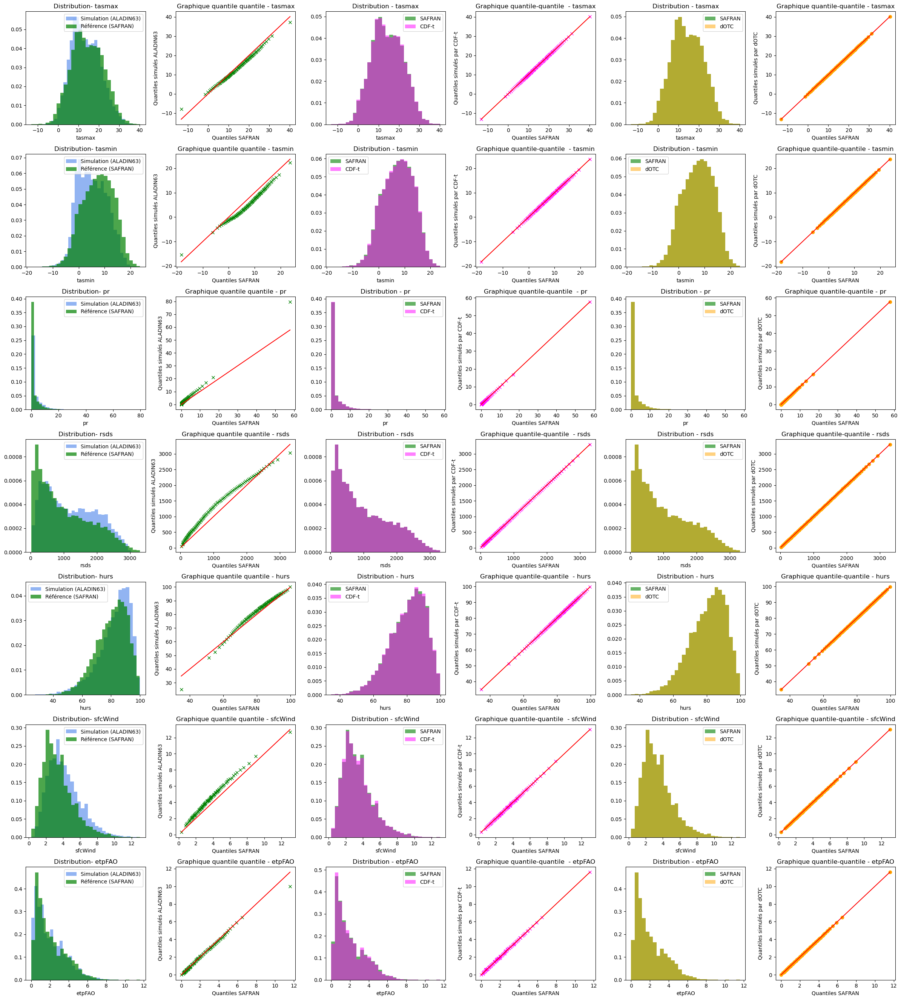

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Chargement fichiers
safran = pd.read_csv("D:/cordex_data/donnees_safran/boignevilleSafranDrias_ETP.csv", sep=";")
hist = pd.read_csv("D:/cordex_data/BoignevilleStation/boigneville-CNRM-CERFACS-CM5_CNRM-ALADIN63-hist.csv", sep=";")
cdft = pd.read_csv("D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv", parse_dates=["date"], sep=";")
dotc = pd.read_csv("D:/cordex_data/modif1/dOTC_final_all_vars_1976_2100.csv", parse_dates=["date"], sep=";")

# Conversion colonnes date
safran["date"] = pd.to_datetime(safran["date"])
hist["date"] = pd.to_datetime(hist["date"], dayfirst=True)
cdft["date"] = pd.to_datetime(cdft["date"])
dotc["date"] = pd.to_datetime(dotc["date"])

# Filtrer période historique 
start_year = 1976
end_year = 2005
mask_safran = (safran["date"].dt.year >= start_year) & (safran["date"].dt.year <= end_year)
mask_hist = (hist["date"].dt.year >= start_year) & (hist["date"].dt.year <= end_year)
mask_cdft = (cdft["date"].dt.year >= start_year) & (cdft["date"].dt.year <= end_year)
mask_dotc = (dotc["date"].dt.year >= start_year) & (dotc["date"].dt.year <= end_year)

safran = safran.loc[mask_safran].reset_index(drop=True)
hist = hist.loc[mask_hist].reset_index(drop=True)
cdft = cdft.loc[mask_cdft].reset_index(drop=True)
dotc = dotc.loc[mask_dotc].reset_index(drop=True)

variables = ['tasmax', 'tasmin', 'pr', 'rsds', 'hurs', 'sfcWind', 'etpFAO']
n_vars = len(variables)

# Création figure
fig, axes = plt.subplots(n_vars, 6, figsize=(24, 4 * n_vars))
#fig.suptitle("Distributions et graphiques quantile-quantile des variables climatiques\nSAFRAN, ALADIN63, CDF-t et dOTC (1976–2005)", fontsize=18, y=0.93)


for i, var in enumerate(variables):
    # Extraction données, en synchronisant si besoin
    obs = safran[var].dropna()
    sim = hist[var].dropna()
    cdft_corr = cdft[f"{var}_corr"].dropna() if f"{var}_corr" in cdft.columns else None
    dotc_corr = dotc[f"{var}_corr"].dropna() if f"{var}_corr" in dotc.columns else None

    
    min_len_obs_sim = min(len(obs), len(sim))
    obs_sim = obs[:min_len_obs_sim]
    sim = sim[:min_len_obs_sim]

    # Quantiles obs
    q_obs = np.quantile(obs, np.linspace(0, 1, 100))
    
    #Histogrammes & QQ-plots Observations vs Simulation brute
    ax_hist_sim = axes[i, 0]
    ax_qq_sim = axes[i, 1]

    ax_hist_sim.hist(sim, bins=30, density=True, alpha=0.7, label="Simulation (ALADIN63)", color="cornflowerblue")
    ax_hist_sim.hist(obs_sim, bins=30, density=True, alpha=0.7, label="Référence (SAFRAN)", color="green")
    ax_hist_sim.set_xlabel(var)
    #ax_hist_sim.set_ylabel("Densité")
    ax_hist_sim.set_title(f"Distribution- {var}")
    ax_hist_sim.legend()

    q_sim = np.quantile(sim, np.linspace(0, 1, 100))
    ax_qq_sim.plot(q_obs, q_sim, marker='x', linestyle='none', color='green')
    ax_qq_sim.plot(q_obs, q_obs, color='red', linestyle='-')
    ax_qq_sim.set_xlabel("Quantiles SAFRAN")
    ax_qq_sim.set_ylabel("Quantiles simulés ALADIN63")
    ax_qq_sim.set_title(f"Graphique quantile quantile - {var}")
    

    # Histogrammes & QQ-plots SAFRAN vs dOTC
    ax_hist_dotc = axes[i, 4]
    ax_qq_dotc = axes[i, 5]

    if dotc_corr is not None:
        min_len_obs_dotc = min(len(obs), len(dotc_corr))
        obs_dotc = obs[:min_len_obs_dotc]
        dotc_corr = dotc_corr[:min_len_obs_dotc]

        ax_hist_dotc.hist(obs_dotc, bins=30, density=True, alpha=0.6, label="SAFRAN", color="green")
        ax_hist_dotc.hist(dotc_corr, bins=30, density=True, alpha=0.5, label="dOTC", color="orange")
        ax_hist_dotc.set_xlabel(var)
        #ax_hist_dotc.set_ylabel("Densité")
        ax_hist_dotc.set_title(f"Distribution - {var}")
        ax_hist_dotc.legend()

        q_dotc = np.quantile(dotc_corr, np.linspace(0, 1, 100))
        ax_qq_dotc.plot(q_obs, q_dotc, marker='o', linestyle='none', color='orange')
        ax_qq_dotc.plot(q_obs, q_obs, color='red')
        ax_qq_dotc.set_xlabel("Quantiles SAFRAN")
        ax_qq_dotc.set_ylabel("Quantiles simulés par dOTC")
        ax_qq_dotc.set_title(f"Graphique quantile-quantile - {var}")
        

    else:
        ax_hist_dotc.axis('off')
        ax_qq_dotc.axis('off')

    #Histogrammes & QQ-plots SAFRAN vs CDF-t
    ax_hist_cdft = axes[i, 2]
    ax_qq_cdft = axes[i, 3]

    if cdft_corr is not None:
        min_len_obs_cdft = min(len(obs), len(cdft_corr))
        obs_cdft = obs[:min_len_obs_cdft]
        cdft_corr = cdft_corr[:min_len_obs_cdft]

        ax_hist_cdft.hist(obs_cdft, bins=30, density=True, alpha=0.6, label="SAFRAN", color="green")
        ax_hist_cdft.hist(cdft_corr, bins=30, density=True, alpha=0.5, label="CDF-t", color="magenta")
        ax_hist_cdft.set_xlabel(var)
        #ax_hist_cdft.set_ylabel("Distribution")
        ax_hist_cdft.set_title(f"Distribution - {var}")
        ax_hist_cdft.legend()

        q_cdft = np.quantile(cdft_corr, np.linspace(0, 1, 100))
        ax_qq_cdft.plot(q_obs, q_cdft, marker='x', linestyle='none', color='magenta')
        ax_qq_cdft.plot(q_obs, q_obs, color='red')
        ax_qq_cdft.set_xlabel("Quantiles SAFRAN")
        ax_qq_cdft.set_ylabel("Quantiles simulés par CDF-t")
        ax_qq_cdft.set_title(f"Graphique quantile-quantile  - {var}")
        # Pas de légende

    else:
        ax_hist_cdft.axis('off')
        ax_qq_cdft.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("corrections123_climatiques.pdf", bbox_inches='tight')
plt.show()

 Avant correction, on observe des écarts marqués entre les distributions simulées et le référence SAFRAN, illustrant la présence de biais dans les simulations brutes.
- Après correction (CDF-t ou dOTC), les distributions corrigées s’alignent nettement mieux sur la référence SAFRAN, pour toutes les variables.
- Les graphiques quantile-quantile (QQ-plots) montrent un rapprochement quasi parfait entre les quantiles corrigés et ceux de la référence (alignement sur la diagonale rouge), ce qui traduit une excellente réduction des biais de distribution.
- Cela confirme l’efficacité des deux méthodes de correction, avec une bonne préservation de la structure statistique des variables.

#### 2. Comparaison des corrélations corrigées : CDF-t vs dOTC

C:\Users\badrah\AppData\Local\Temp\ipykernel_28288\228606707.py:146: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  leg = ax.legend(fontsize=11, loc="upper right")


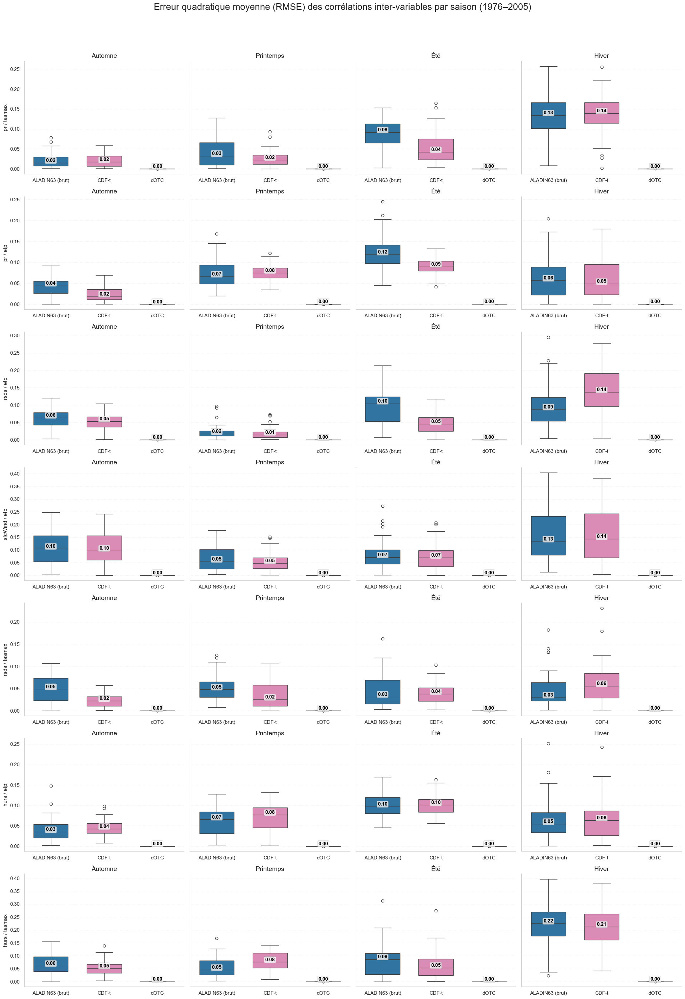

In [26]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import root_mean_squared_error

# === Fonctions utilitaires ===
def get_saison(mois):
    if mois in [12, 1, 2]:
        return "Hiver"
    elif mois in [3, 4, 5]:
        return "Printemps"
    elif mois in [6, 7, 8]:
        return "Été"
    else:
        return "Automne"

def prepare_df(df, start="1976-01-01", end="2005-12-31"):
    df["date"] = pd.to_datetime(df["date"], errors="coerce")
    df["mois"] = df["date"].dt.month
    df["saison"] = df["mois"].apply(get_saison)
    return df[(df["date"] >= start) & (df["date"] <= end)]

# === Chemins
base = "D:/cordex_data/projet_climat"
chemin_obs  = os.path.join(base, "extracted_csv/stations_SAFRAN")
chemin_hist = os.path.join(base, "extracted_csv/stations_hist/ALADIN63")
chemin_cdft = os.path.join(base, "debiaised/ALADIN-CDFT")
chemin_dotc = os.path.join(base, "debiaised/ALADIN-dOTC")

stations = [f.replace("_SafranDrias.csv", "") for f in os.listdir(chemin_obs) if f.endswith(".csv")]
variables = ["tasmax", "tasmin", "rsds", "sfcWind", "hurs", "pr", "etp"]

paires = [
    ("pr", "tasmax"), ("pr", "etp"),
    ("rsds", "etp"), ("sfcWind", "etp"),
    ("rsds", "tasmax"), ("hurs", "etp"), ("hurs", "tasmax")
]

resultats = []

for station in stations:
    try:
        obs  = prepare_df(pd.read_csv(os.path.join(chemin_obs,  f"{station}_SafranDrias.csv"), sep=";"))
        hist = prepare_df(pd.read_csv(os.path.join(chemin_hist, f"stations_hist{station}-ALADIN63-hist.csv"), sep=";"))
        cdft = prepare_df(pd.read_csv(os.path.join(chemin_cdft, f"CDFT_all_vars_{station}_CNRM-ALADIN63_rcp45_1976_2100.csv"), sep=";"))
        dotc = prepare_df(pd.read_csv(os.path.join(chemin_dotc, f"dOTC_all_vars_{station}_ALADIN63_rcp45_1976_2100.csv"), sep=";"))

        cdft = cdft.rename(columns={**{v: f"{v}_corr" for v in variables if v != "etp"}, "etp": "etpFAO_corr"})
        dotc = dotc.rename(columns={v: f"{v}_corr" for v in variables})

        for var1, var2 in paires:
            def corr_saison(df, col1, col2):
                grp = df.groupby("saison")[[col1, col2]].corr().iloc[0::2, 1].reset_index(level=1, drop=True)
                return grp.dropna()
            col_cdft_1 = f"{var1}_corr" if var1 != "etp" else "etpFAO_corr"
            col_cdft_2 = f"{var2}_corr" if var2 != "etp" else "etpFAO_corr"
            col_dotc_1 = f"{var1}_corr"
            col_dotc_2 = f"{var2}_corr"
            corr_obs  = corr_saison(obs,  var1, var2)
            corr_hist = corr_saison(hist, var1, var2)
            corr_cdft = corr_saison(cdft, col_cdft_1, col_cdft_2)
            corr_dotc = corr_saison(dotc, col_dotc_1, col_dotc_2)
            saisons_valides = (
                corr_obs.index.intersection(corr_hist.index)
                .intersection(corr_cdft.index)
                .intersection(corr_dotc.index)
            )
            for saison in saisons_valides:
                resultats.append({
                    "station": station,
                    "saison": saison,
                    "paire": f"{var1} / {var2}",
                    "Méthode": "ALADIN63 (brut)",
                    "RMSE": root_mean_squared_error([corr_obs.loc[saison]], [corr_hist.loc[saison]])
                })
                resultats.append({
                    "station": station,
                    "saison": saison,
                    "paire": f"{var1} / {var2}",
                    "Méthode": "CDF-t",
                    "RMSE": root_mean_squared_error([corr_obs.loc[saison]], [corr_cdft.loc[saison]])
                })
                resultats.append({
                    "station": station,
                    "saison": saison,
                    "paire": f"{var1} / {var2}",
                    "Méthode": "dOTC",
                    "RMSE": root_mean_squared_error([corr_obs.loc[saison]], [corr_dotc.loc[saison]])
                })
    except Exception as e:
        print(f" Station ignorée : {station} – {e}")

df = pd.DataFrame(resultats)
ordre_saisons = ["Automne", "Printemps", "Été", "Hiver"]
df["saison"] = pd.Categorical(df["saison"], categories=ordre_saisons, ordered=True)

palette = {
    "ALADIN63 (brut)": "#1f77b4",  # bleu
    "CDF-t": "#e77fb7",            # rose vif
    "dOTC": "#cc5500"              # orange foncé
}

# STYLE
sns.set_context("notebook")
sns.set_style("whitegrid")
plt.rcParams.update({
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False
})

paires_uniques = df["paire"].unique()
fig, axes = plt.subplots(len(paires_uniques), 4, figsize=(21, 4.3 * len(paires_uniques)), sharey="row")

for i, paire in enumerate(paires_uniques):
    for j, saison in enumerate(ordre_saisons):
        ax = axes[i, j] if len(paires_uniques) > 1 else axes[j]
        data = df[(df["paire"] == paire) & (df["saison"] == saison)]
        box = sns.boxplot(
            data=data, x="Méthode", y="RMSE", hue="Méthode",
            palette=palette, ax=ax, width=0.65,
            order=["ALADIN63 (brut)", "CDF-t", "dOTC"],
            dodge=False, showfliers=True
        )
        ax.set_title(saison, fontsize=14, pad=7)
        ax.set_xlabel("")
        ax.grid(axis="y", linestyle=":", alpha=0.28)
        if j == 0:
            ax.set_ylabel(f"{paire}", fontsize=12)
        else:
            ax.set_ylabel("")
        # Annotation médiane sur chaque box
        for tick, method in enumerate(["ALADIN63 (brut)", "CDF-t", "dOTC"]):
            vals = data.loc[data["Méthode"] == method, "RMSE"].dropna()
            if len(vals):
                median = np.median(vals)
                ax.text(
                    tick, median, f"{median:.2f}", color="k",
                    ha="center", va="bottom", fontsize=11, fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.18", facecolor="#f5f5f5cc", edgecolor="gray", linewidth=0.2)
                )
        # Légende
        if i == 0 and j == 0:
            leg = ax.legend(fontsize=11, loc="upper right")
        else:
            leg = ax.get_legend()
            if leg is not None:
                leg.remove()

fig.suptitle("Erreur quadratique moyenne (RMSE) des corrélations inter-variables par saison (1976–2005)", fontsize=20, y=1.01)
plt.tight_layout(rect=[0, 0, 1, 0.98])

plt.savefig("rmse_correlation_saisons.pdf", bbox_inches='tight')
plt.show()

Les boxplots ci-dessus montrent la distribution saisonnière du RMSE des corrélations inter-variables
(par exemple : pr/tasmax, pr/etp, rsds/etp), calculé par rapport à la référence SAFRAN, pour les différentes méthodes :
- Simulation brute (ALADIN63)
- Correction par CDF-t
- Correction par dOTC

On voit que :
- Pour toutes les saisons et tous les couples de variables, le RMSE des corrélations est le plus élevé dans la simulation brute, indiquant une mauvaise reproduction des dépendances inter-variables par le modèle non corrigé.
- Après correction par CDF-t, le RMSE diminue mais reste significatif : la méthode réduit partiellement l’écart de corrélation avec la référence, sans le supprimer complètement.
- Après correction par dOTC, le RMSE des corrélations devient quasi nul, quelle que soit la saison ou le couple de variables. Cela montre une préservation/exacte restitution des structures de dépendance observées dans SAFRAN.
- La variabilité saisonnière des erreurs sur les corrélations, visible sur les données brutes, est complètement corrigée après application de dOTC.

On conclut alors que : 
La méthode dOTC préserve les corrélations inter-variables de SAFRAN.

##### Exemple : Site SAFRAN Boigneville

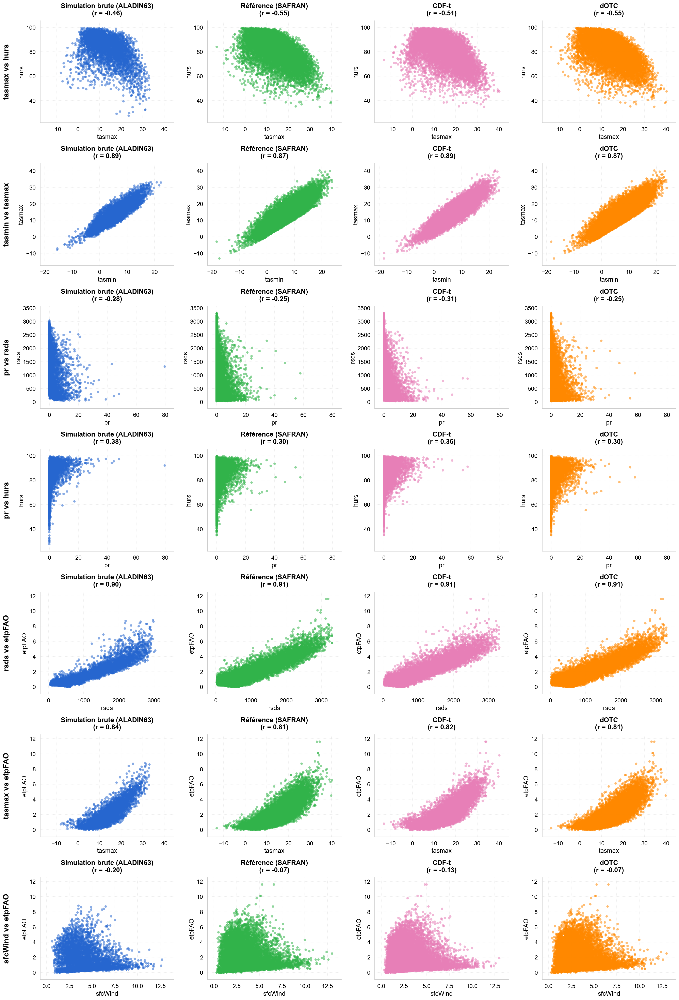

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# Chargement des données
safran = pd.read_csv("D:/cordex_data/donnees_safran/boignevilleSafranDrias_ETP.csv", sep=";")
sim_brute = pd.read_csv("D:/cordex_data/BoignevilleStation/boigneville-CNRM-CERFACS-CM5_CNRM-ALADIN63-hist.csv", sep=";")
cdft = pd.read_csv("D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv", sep=";")
dotc = pd.read_csv("D:/cordex_data/modif1/dOTC_final_all_vars_1976_2100.csv", sep=";")

for df in [safran, sim_brute, cdft, dotc]:
    df['date'] = pd.to_datetime(df['date'], errors='coerce')

periode_hist = (1976, 2005)
safran = safran[(safran["date"].dt.year >= periode_hist[0]) & (safran["date"].dt.year <= periode_hist[1])].reset_index(drop=True)
sim_brute = sim_brute[(sim_brute["date"].dt.year >= periode_hist[0]) & (sim_brute["date"].dt.year <= periode_hist[1])].reset_index(drop=True)
cdft = cdft[(cdft["date"].dt.year >= periode_hist[0]) & (cdft["date"].dt.year <= periode_hist[1])].reset_index(drop=True)
dotc = dotc[(dotc["date"].dt.year >= periode_hist[0]) & (dotc["date"].dt.year <= periode_hist[1])].reset_index(drop=True)

# Palette (contraste optimisé)
palette = {
    "Simulation brute (ALADIN63)": "#2666CF",    # Bleu franc
    "Référence (SAFRAN)": "#31B34A",             # Vert vif
    "CDF-t": "#e77fb7",                          # Rose prononcé
    "dOTC": "#FF8800"                            # Orange vif et moderne
}

pairs = [
    ("tasmax", "hurs"),
    ("tasmin", "tasmax"),
    ("pr", "rsds"),
    ("pr", "hurs"),
    ("rsds", "etpFAO"),
    ("tasmax", "etpFAO"),
    ("sfcWind", "etpFAO")
]

def get_col(df, var):
    if var == "etpFAO":
        if "etpFAO" in df.columns:
            return df["etpFAO"]
        if "etp" in df.columns:
            return df["etp"]
        if "etpFAO_corr" in df.columns:
            return df["etpFAO_corr"]
        if "etp_corr" in df.columns:
            return df["etp_corr"]
    if f"{var}_corr" in df.columns:
        return df[f"{var}_corr"]
    return df[var]

n_pairs = len(pairs)
fig, axes = plt.subplots(n_pairs, 4, figsize=(22, 4.6 * n_pairs), dpi=160)
labels = ["Simulation brute (ALADIN63)", "Référence (SAFRAN)", "CDF-t", "dOTC"]

for i, (var1, var2) in enumerate(pairs):
    x_all = []
    y_all = []
    for df in [sim_brute, safran, cdft, dotc]:
        x_all.append(get_col(df, var1))
        y_all.append(get_col(df, var2))
    x_min = min([x.min() for x in x_all if np.isfinite(x.min())])
    x_max = max([x.max() for x in x_all if np.isfinite(x.max())])
    y_min = min([y.min() for y in y_all if np.isfinite(y.min())])
    y_max = max([y.max() for y in y_all if np.isfinite(y.max())])
    x_margin = (x_max - x_min) * 0.08
    y_margin = (y_max - y_min) * 0.08
    x_lim = (x_min - x_margin, x_max + x_margin)
    y_lim = (y_min - y_margin, y_max + y_margin)

    for j, (df, label) in enumerate(zip([sim_brute, safran, cdft, dotc], labels)):
        ax = axes[i, j]
        x = get_col(df, var1)
        y = get_col(df, var2)
        ax.scatter(
            x, y, alpha=0.55, s=28, color=palette[label], edgecolor="none", rasterized=True
        )
        mask = np.isfinite(x) & np.isfinite(y)
        if mask.sum() > 3:
            r, _ = pearsonr(x[mask], y[mask])
        else:
            r = np.nan
        # --- TITRE : couleur principale, police noire
        titre = f"{label}\n(r = {r:.2f})" if not np.isnan(r) else label
        ax.set_title(titre, fontsize=15, color="black", fontweight="bold", pad=12)
        # --- TOUT LE RESTE EN NOIR
        ax.set_xlabel(var1, fontsize=14, color="black")
        ax.set_ylabel(var2, fontsize=14, color="black")
        ax.tick_params(axis="both", labelsize=13, colors="black")
        # Bordures
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlim(x_lim)
        ax.set_ylim(y_lim)
        ax.grid(axis="both", linestyle=":", alpha=0.35)
        # Optionnel : Nom du couple de variables à gauche de chaque ligne
    axes[i, 0].annotate(f"{var1} vs {var2}", xy=(-0.25, 0.5), xycoords='axes fraction',
                        fontsize=17, fontweight="bold", rotation=90, va='center', ha='center', color="black")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.subplots_adjust(left=0.10, top=0.94, wspace=0.25)

# Export PDF haute qualité
pdf_filename = "correlations_inter_variables_boigneville.pdf"
plt.savefig(pdf_filename, bbox_inches='tight', dpi=300)
plt.show()

#### 3. Analyse des moyennes et variances (mensuelles et annuelles) : comparaison CDF-t / DRIAS (Météo-France)


#### Période historique 1976 -2005 

C:\Users\badrah\AppData\Local\Temp\ipykernel_28288\1151958402.py:165: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


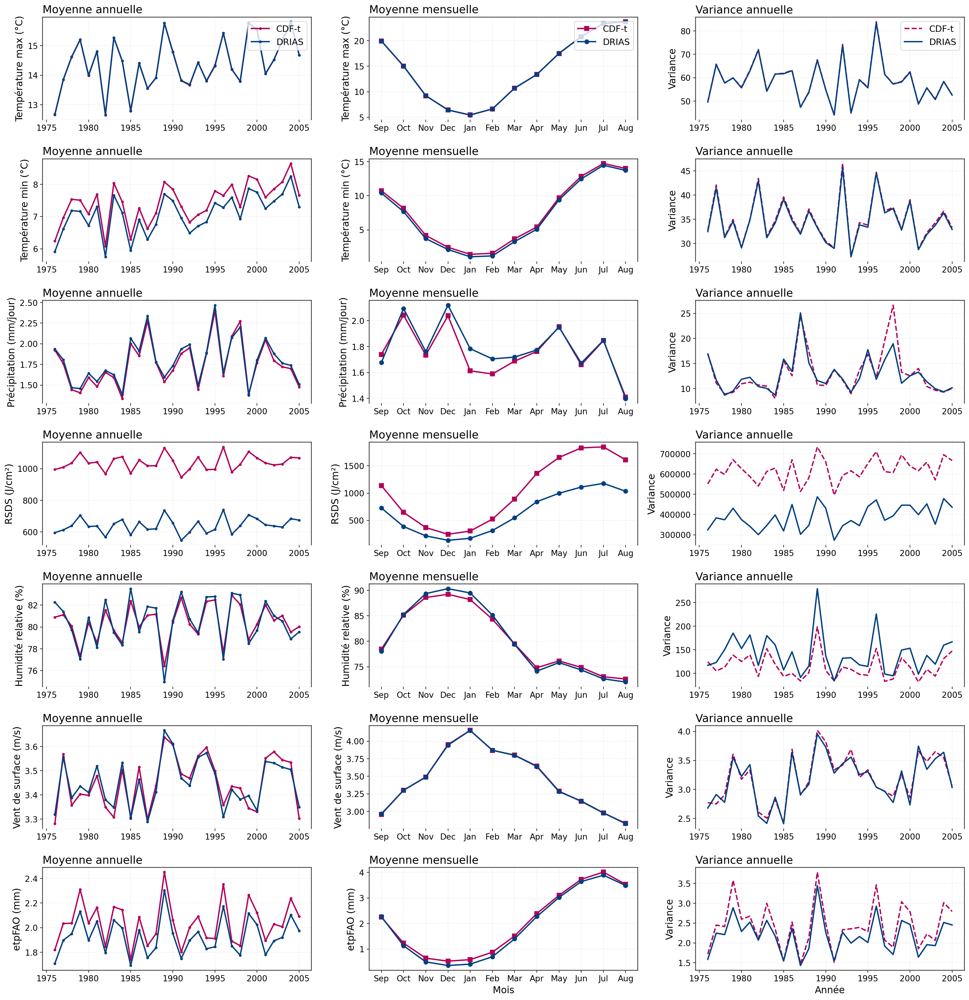

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Paramètres d'affichage pour une figure professionnelle ---
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "legend.fontsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1.1,
    "grid.alpha": 0.2,
    "grid.linestyle": "--"
})

# === Dictionnaire des variables analysées ===
# Pour chaque variable, on indique les fichiers utilisés, le nom de la colonne à lire,
# et le label qui sera affiché sur l'axe Y.
variables_info = {
    # 1. Température maximale quotidienne
    "tasmax": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/tasmax_corr_Boigneville.csv",
        "var_cdf": "tasmax_corr",
        "var_drias": "tasmax_c",
        "ylabel": "Température max (°C)"
    },
    # 2. Température minimale quotidienne
    "tasmin": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/tasmin_corr_Boigneville.csv",
        "var_cdf": "tasmin_corr",
        "var_drias": "tasmin_c",
        "ylabel": "Température min (°C)"
    },
    # 3. Précipitations quotidiennes
    "pr": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/pr_corr_Boigneville.csv",
        "var_cdf": "pr_corr",
        "var_drias": "pr_c",
        "ylabel": "Précipitation (mm/jour)"
    },
    # 4. Rayonnement solaire incident
    "rsds": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/rsds_corr_Boigneville_fut.csv",
        "var_cdf": "rsds_corr",
        "var_drias": "rsds_c",
        "ylabel": "RSDS (J/cm²)"
    },
    # 5. Humidité relative
    "hurs": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/hurs_calculated_merged.csv",
        "var_cdf": "hurs_corr",
        "var_drias": "hurs_recalculee",
        "ylabel": "Humidité relative (%)"
    },
    # 6. Vent de surface
    "sfcWind": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/sfcWind_corr_Boigneville_merged.csv",
        "var_cdf": "sfcWind_corr",
        "var_drias": "sfcWind_c",
        "ylabel": "Vent de surface (m/s)"
    },
    # 7. Evapotranspiration potentielle (méthode FAO)
    "etpFAO": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/evspsblpotAdjust_corr_Boignevillefut.csv",
        "var_cdf": "etpFAO_corr",
        "var_drias": "etpFAO_c",
        "ylabel": "etpFAO (mm)"
    }
}

# --- Période analysée ---
start_date, end_date = "1976-01-01", "2005-12-31"

# --- Création de la figure et de la grille d'axes (1 ligne/variable, 3 colonnes : moyenne annuelle, mensuelle, variance) ---
n_vars = len(variables_info)
fig, axes = plt.subplots(n_vars, 3, figsize=(20, 3 * n_vars), dpi=160, constrained_layout=True)
fig.patch.set_facecolor('white')

# --- Ordre et labels des mois pour l'affichage saisonnier (commence en septembre pour l'année agricole) ---
mois_order = [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8]
mois_labels = ["Sep", "Oct", "Nov", "Dec", "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug"]

# --- Couleurs utilisées pour distinguer les méthodes ---
col_cdf = "#B30059"    # prune foncé pour CDF-t
col_drias = "#004080"  # bleu foncé pour DRIAS

# --- Boucle sur chaque variable climatique ---
for i, (var, info) in enumerate(variables_info.items()):
    # Chargement des données corrigées CDF-t et DRIAS pour la variable analysée
    df_cdft = pd.read_csv(info["cdf_file"], sep=";")
    df_drias = pd.read_csv(info["drias_file"], sep=";")
    
    # Préparation des colonnes de date, année, mois
    for df in [df_cdft, df_drias]:
        df["date"] = pd.to_datetime(df["date"], errors="coerce")
        df["year"] = df["date"].dt.year
        df["month"] = df["date"].dt.month
    
    # Filtrage sur la période d'intérêt
    df_cdft = df_cdft[(df_cdft["date"] >= start_date) & (df_cdft["date"] <= end_date)]
    df_drias = df_drias[(df_drias["date"] >= start_date) & (df_drias["date"] <= end_date)]
    
    # Calcul des statistiques annuelles (moyenne et variance par an)
    stats_cdft = df_cdft.groupby("year")[info["var_cdf"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_cdft", "var": "var_cdft"})
    stats_drias = df_drias.groupby("year")[info["var_drias"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_drias", "var": "var_drias"})
    
    # Calcul de la moyenne mensuelle (par mois, toutes années confondues)
    mean_cdft = df_cdft.groupby("month")[info["var_cdf"]].mean().reindex(mois_order)
    mean_drias = df_drias.groupby("month")[info["var_drias"]].mean().reindex(mois_order)
    
    # ==== Tracé des courbes ====
    # Moyenne annuelle
    ax = axes[i, 0]
    ax.plot(stats_cdft["year"], stats_cdft["mean_cdft"], label="CDF-t", marker="o", markersize=3, linewidth=2, color=col_cdf)
    ax.plot(stats_drias["year"], stats_drias["mean_drias"], label="DRIAS", marker="o", markersize=3, linewidth=2, color=col_drias)
    ax.set_title(f"Moyenne annuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")
    
    # Moyenne mensuelle
    ax = axes[i, 1]
    ax.plot(mois_labels, mean_cdft.values, label="CDF-t", marker='s', linewidth=2, color=col_cdf)
    ax.plot(mois_labels, mean_drias.values, label="DRIAS", marker='o', linewidth=2, color=col_drias)
    ax.set_title(f"Moyenne mensuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")
    if i == n_vars - 1:
        ax.set_xlabel("Mois")
    
    # Variance annuelle
    ax = axes[i, 2]
    ax.plot(stats_cdft["year"], stats_cdft["var_cdft"], label="CDF-t", linestyle="--", linewidth=2, color=col_cdf)
    ax.plot(stats_drias["year"], stats_drias["var_drias"], label="DRIAS", linestyle="-", linewidth=2, color=col_drias)
    ax.set_title(f"Variance annuelle", loc='left')
    ax.set_ylabel("Variance")
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")
    if i == n_vars - 1:
        ax.set_xlabel("Année")
    
    # Lignes séparatrices horizontales pour chaque variable sauf la dernière
    if i < n_vars - 1:
        for j in range(3):
            axes[i, j].spines['bottom'].set_visible(False)
            axes[i, j].axhline(y=axes[i, j].get_ylim()[0], color="#bbbbbb", linewidth=0.8, alpha=0.7, linestyle=":")

# --- Légende globale et annotation générale ---


plt.tight_layout()
plt.subplots_adjust(top=0.96, hspace=0.38)
plt.savefig("variances_climatiques_hist1.pdf", bbox_inches='tight')
plt.savefig("variances_climatiques_hist.png", bbox_inches='tight', dpi=200)
plt.show()

#### Période de projection 2005 - 2100

C:\Users\badrah\AppData\Local\Temp\ipykernel_28288\903515289.py:143: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


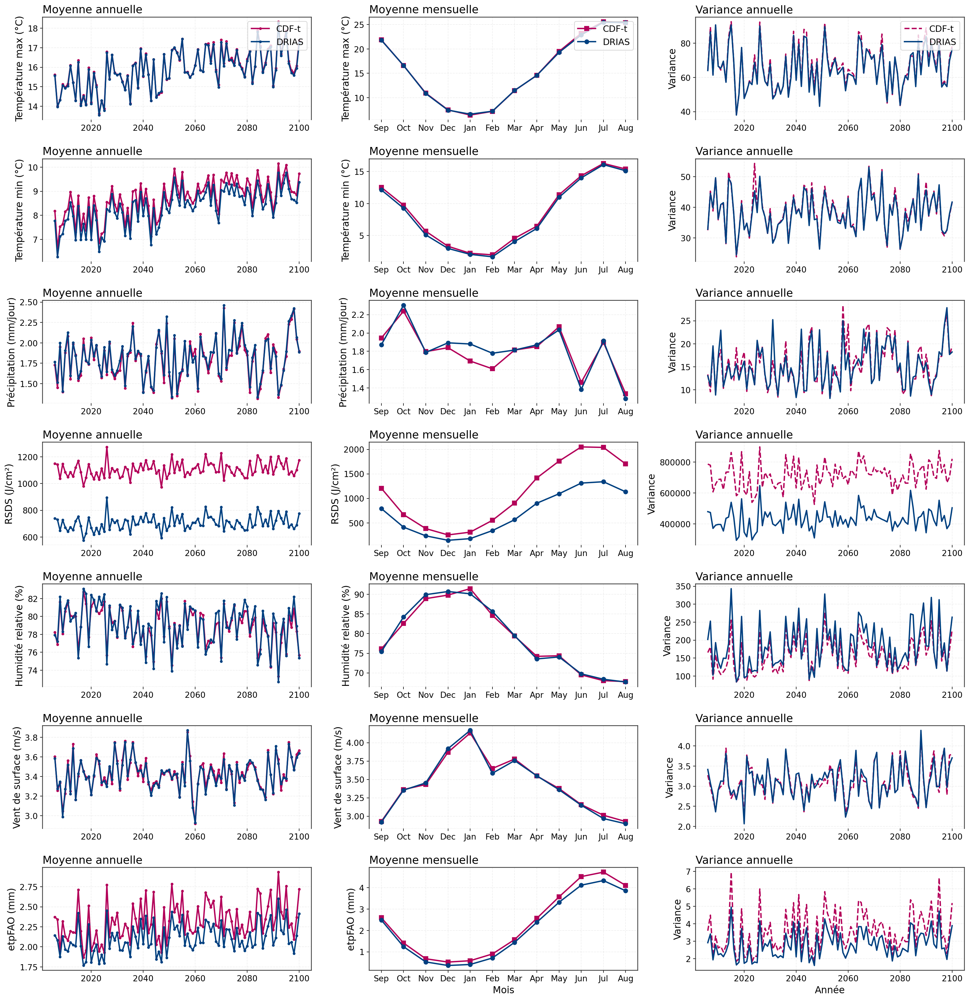

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Paramètres d'affichage pour une figure professionnelle ---
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "legend.fontsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1.1,
    "grid.alpha": 0.2,
    "grid.linestyle": "--"
})

# === Dictionnaire des variables analysées ===
variables_info = {
    "tasmax": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/tasmax_corr_Boigneville.csv",
        "var_cdf": "tasmax_corr",
        "var_drias": "tasmax_c",
        "ylabel": "Température max (°C)"
    },
    "tasmin": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/tasmin_corr_Boigneville.csv",
        "var_cdf": "tasmin_corr",
        "var_drias": "tasmin_c",
        "ylabel": "Température min (°C)"
    },
    "pr": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/pr_corr_Boigneville.csv",
        "var_cdf": "pr_corr",
        "var_drias": "pr_c",
        "ylabel": "Précipitation (mm/jour)"
    },
    "rsds": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/rsds_corr_Boigneville_fut.csv",
        "var_cdf": "rsds_corr",
        "var_drias": "rsds_c",
        "ylabel": "RSDS (J/cm²)"
    },
    "hurs": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/hurs_calculated_merged.csv",
        "var_cdf": "hurs_corr",
        "var_drias": "hurs_recalculee",
        "ylabel": "Humidité relative (%)"
    },
    "sfcWind": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/sfcWind_corr_Boigneville_merged.csv",
        "var_cdf": "sfcWind_corr",
        "var_drias": "sfcWind_c",
        "ylabel": "Vent de surface (m/s)"
    },
    "etpFAO": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "drias_file": "D:/cordex_data/BoignevilleStation/DriasDebiaissage/evspsblpotAdjust_corr_Boignevillehist.csv",
        "var_cdf": "etpFAO_corr",
        "var_drias": "etpFAO_c",
        "ylabel": "etpFAO (mm)"
    }
}

# --- Période future ---
start_date, end_date = "2006-01-01", "2100-12-31"

# --- Création de la figure ---
n_vars = len(variables_info)
fig, axes = plt.subplots(n_vars, 3, figsize=(20, 3 * n_vars), dpi=160, constrained_layout=True)
fig.patch.set_facecolor('white')

mois_order = [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8]
mois_labels = ["Sep", "Oct", "Nov", "Dec", "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug"]

col_cdf = "#B30059"
col_drias = "#004080"

for i, (var, info) in enumerate(variables_info.items()):
    df_cdft = pd.read_csv(info["cdf_file"], sep=";")
    df_drias = pd.read_csv(info["drias_file"], sep=";")

    for df in [df_cdft, df_drias]:
        df["date"] = pd.to_datetime(df["date"], errors="coerce")
        df["year"] = df["date"].dt.year
        df["month"] = df["date"].dt.month

    df_cdft = df_cdft[(df_cdft["date"] >= start_date) & (df_cdft["date"] <= end_date)]
    df_drias = df_drias[(df_drias["date"] >= start_date) & (df_drias["date"] <= end_date)]

    stats_cdft = df_cdft.groupby("year")[info["var_cdf"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_cdft", "var": "var_cdft"})
    stats_drias = df_drias.groupby("year")[info["var_drias"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_drias", "var": "var_drias"})

    mean_cdft = df_cdft.groupby("month")[info["var_cdf"]].mean().reindex(mois_order)
    mean_drias = df_drias.groupby("month")[info["var_drias"]].mean().reindex(mois_order)

    # Moyenne annuelle
    ax = axes[i, 0]
    ax.plot(stats_cdft["year"], stats_cdft["mean_cdft"], label="CDF-t", marker="o", markersize=3, linewidth=2, color=col_cdf)
    ax.plot(stats_drias["year"], stats_drias["mean_drias"], label="DRIAS", marker="o", markersize=3, linewidth=2, color=col_drias)
    ax.set_title(f"Moyenne annuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")

    # Moyenne mensuelle
    ax = axes[i, 1]
    ax.plot(mois_labels, mean_cdft.values, label="CDF-t", marker='s', linewidth=2, color=col_cdf)
    ax.plot(mois_labels, mean_drias.values, label="DRIAS", marker='o', linewidth=2, color=col_drias)
    ax.set_title(f"Moyenne mensuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")
    if i == n_vars - 1:
        ax.set_xlabel("Mois")

    # Variance annuelle
    ax = axes[i, 2]
    ax.plot(stats_cdft["year"], stats_cdft["var_cdft"], label="CDF-t", linestyle="--", linewidth=2, color=col_cdf)
    ax.plot(stats_drias["year"], stats_drias["var_drias"], label="DRIAS", linestyle="-", linewidth=2, color=col_drias)
    ax.set_title(f"Variance annuelle", loc='left')
    ax.set_ylabel("Variance")
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(loc="upper right")
    if i == n_vars - 1:
        ax.set_xlabel("Année")

    if i < n_vars - 1:
        for j in range(3):
            axes[i, j].spines['bottom'].set_visible(False)
            axes[i, j].axhline(y=axes[i, j].get_ylim()[0], color="#bbbbbb", linewidth=0.8, alpha=0.7, linestyle=":")

plt.tight_layout()
plt.subplots_adjust(top=0.96, hspace=0.38)
plt.savefig("variances_climatiques_future.pdf", bbox_inches='tight')
plt.savefig("variances_climatiques_future.png", bbox_inches='tight', dpi=200)
plt.show()

#### 4. Comparaison des moyennes et variances (mensuelles et annuelles) : CDF-t vs dOTC


#### Période historique 1976 -2005 

Traitement de la variable : tasmax
Traitement de la variable : tasmin
Traitement de la variable : pr
Traitement de la variable : rsds
Traitement de la variable : hurs
Traitement de la variable : sfcWind
Traitement de la variable : etpFAO


C:\Users\badrah\AppData\Local\Temp\ipykernel_28288\2195464803.py:147: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.96])


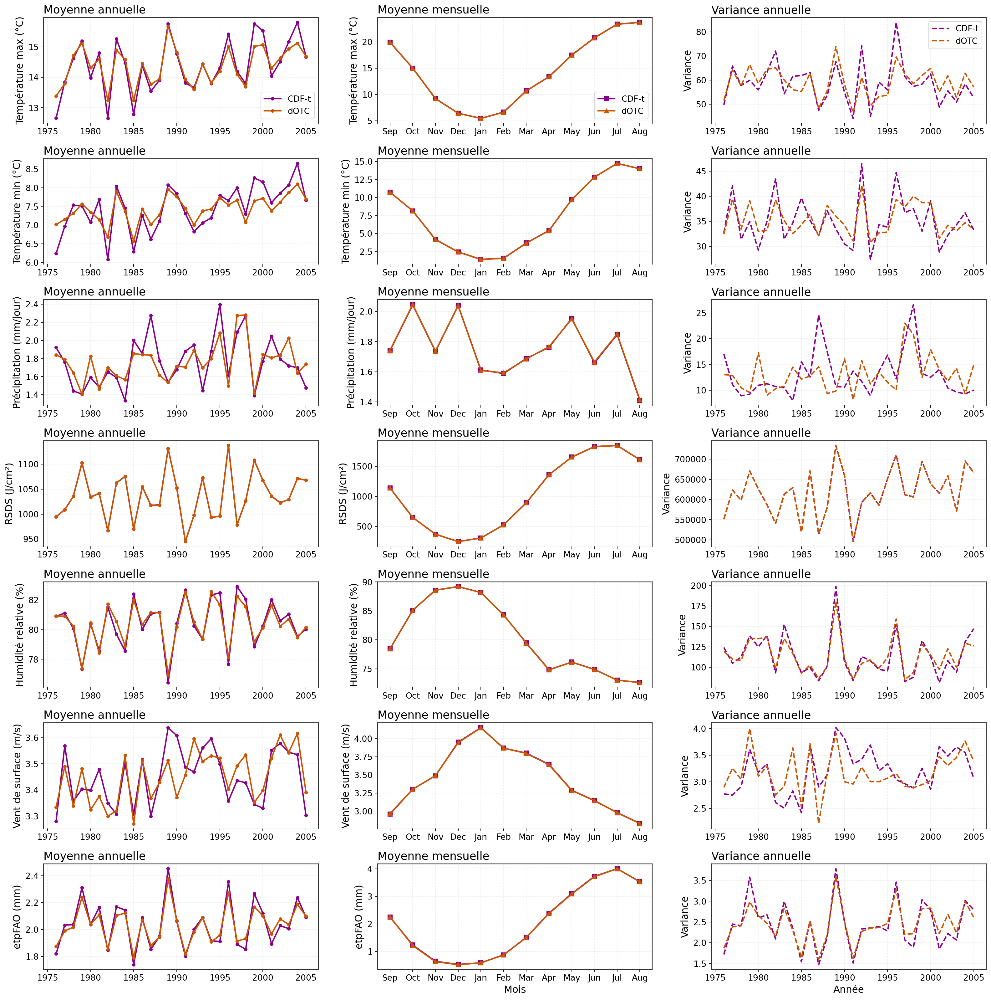

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Style professionnel pour toutes les figures ---
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "legend.fontsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1.1,
    "grid.alpha": 0.2,
    "grid.linestyle": "--"
})

# === Variables et fichiers ===
variables_info = {
    "tasmax": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "tasmax_corr",
        "var_dotc": "tasmax_corr",
        "ylabel": "Température max (°C)"
    },
    "tasmin": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "tasmin_corr",
        "var_dotc": "tasmin_corr",
        "ylabel": "Température min (°C)"
    },
    "pr": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "pr_corr",
        "var_dotc": "pr_corr",
        "ylabel": "Précipitation (mm/jour)"
    },
    "rsds": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "rsds_corr",
        "var_dotc": "rsds_corr",
        "ylabel": "RSDS (J/cm²)"
    },
    "hurs": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "hurs_corr",
        "var_dotc": "hurs_corr",
        "ylabel": "Humidité relative (%)"
    },
    "sfcWind": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "sfcWind_corr",
        "var_dotc": "sfcWind_corr",
        "ylabel": "Vent de surface (m/s)"
    },
    "etpFAO": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "etpFAO_corr",
        "var_dotc": "etpFAO_corr",
        "ylabel": "etpFAO (mm)"  # <-- ici le nom code pour l’axe Y
    }
}

dotc_file = "D:/cordex_data/modif1/dOTC_final_all_vars_1976_2100.csv"
start_date, end_date = "1976-01-01", "2005-12-31"

df_dotc_all = pd.read_csv(dotc_file, sep=";")
df_dotc_all["date"] = pd.to_datetime(df_dotc_all["date"], errors="coerce")
df_dotc_all["year"] = df_dotc_all["date"].dt.year
df_dotc_all["month"] = df_dotc_all["date"].dt.month

n_vars = len(variables_info)
fig, axes = plt.subplots(n_vars, 3, figsize=(20, 3 * n_vars), dpi=160, constrained_layout=True)
fig.patch.set_facecolor('white')

mois_order = [9,10,11,12,1,2,3,4,5,6,7,8]
mois_labels = ["Sep","Oct","Nov","Dec","Jan","Feb","Mar","Apr","May","Jun","Jul","Aug"]

col_cdf = "#8B008B"
col_dotc = "#cc5500"

for i, (var, info) in enumerate(variables_info.items()):
    print(f"Traitement de la variable : {var}")

    df_cdft = pd.read_csv(info["cdf_file"], sep=";")
    df_dotc = df_dotc_all[["date", info["var_dotc"], "year", "month"]].copy()

    df_cdft["date"] = pd.to_datetime(df_cdft["date"], errors="coerce")
    df_cdft["year"] = df_cdft["date"].dt.year
    df_cdft["month"] = df_cdft["date"].dt.month

    df_cdft = df_cdft[(df_cdft["date"] >= start_date) & (df_cdft["date"] <= end_date)]
    df_dotc = df_dotc[(df_dotc["date"] >= start_date) & (df_dotc["date"] <= end_date)]

    stats_cdft = df_cdft.groupby("year")[info["var_cdf"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_cdft", "var": "var_cdft"})
    stats_dotc = df_dotc.groupby("year")[info["var_dotc"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_dotc", "var": "var_dotc"})

    mean_cdft = df_cdft.groupby("month")[info["var_cdf"]].mean().reindex(mois_order)
    mean_dotc = df_dotc.groupby("month")[info["var_dotc"]].mean().reindex(mois_order)

    monthly_means = pd.DataFrame({
        "Mois": mois_order,
        "CDF-t": mean_cdft.values,
        "dOTC": mean_dotc.values,
    })

    # Moyenne annuelle (lignes continues avec marqueurs pleins)
    ax = axes[i, 0]
    ax.plot(stats_cdft["year"], stats_cdft["mean_cdft"], label="CDF-t", linestyle="-", marker="o", markersize=4, linewidth=2, color=col_cdf)
    ax.plot(stats_dotc["year"], stats_dotc["mean_dotc"], label="dOTC", linestyle="-", marker="o", markersize=4, linewidth=2, color=col_dotc)
    ax.set_title(f"Moyenne annuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    if i == 0:
        ax.legend(fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.2)

    # Moyenne mensuelle
    ax = axes[i, 1]
    ax.plot(mois_labels, monthly_means["CDF-t"], label="CDF-t", marker='s', linestyle='-', linewidth=2, color=col_cdf)
    ax.plot(mois_labels, monthly_means["dOTC"], label="dOTC", marker='^', linestyle='-', linewidth=2, color=col_dotc)
    ax.set_title(f"Moyenne mensuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    if i == n_vars - 1:
        ax.set_xlabel("Mois")
    if i == 0:
        ax.legend(fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.2)

    # Variance annuelle
    ax = axes[i, 2]
    ax.plot(stats_cdft["year"], stats_cdft["var_cdft"], label="CDF-t", linestyle="--", linewidth=2, color=col_cdf)
    ax.plot(stats_dotc["year"], stats_dotc["var_dotc"], label="dOTC", linestyle="--", linewidth=2, color=col_dotc)
    ax.set_title(f"Variance annuelle", loc='left')
    ax.set_ylabel("Variance")
    if i == n_vars - 1:
        ax.set_xlabel("Année")
    if i == 0:
        ax.legend(fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.2)

    # Lignes séparatrices horizontales pour chaque variable sauf la dernière
    if i < n_vars - 1:
        for j in range(3):
            axes[i, j].spines['bottom'].set_visible(False)
            axes[i, j].axhline(y=axes[i, j].get_ylim()[0], color="#bbbbbb", linewidth=0.8, alpha=0.7, linestyle=":")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("variances_climatiques_hist_dOTC.pdf", bbox_inches='tight')
plt.show()

#### Période de projection 2006 - 2100

Traitement de la variable : tasmax
Traitement de la variable : tasmin
Traitement de la variable : pr
Traitement de la variable : rsds
Traitement de la variable : hurs
Traitement de la variable : sfcWind
Traitement de la variable : etpFAO


C:\Users\badrah\AppData\Local\Temp\ipykernel_28288\240705571.py:147: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.96])


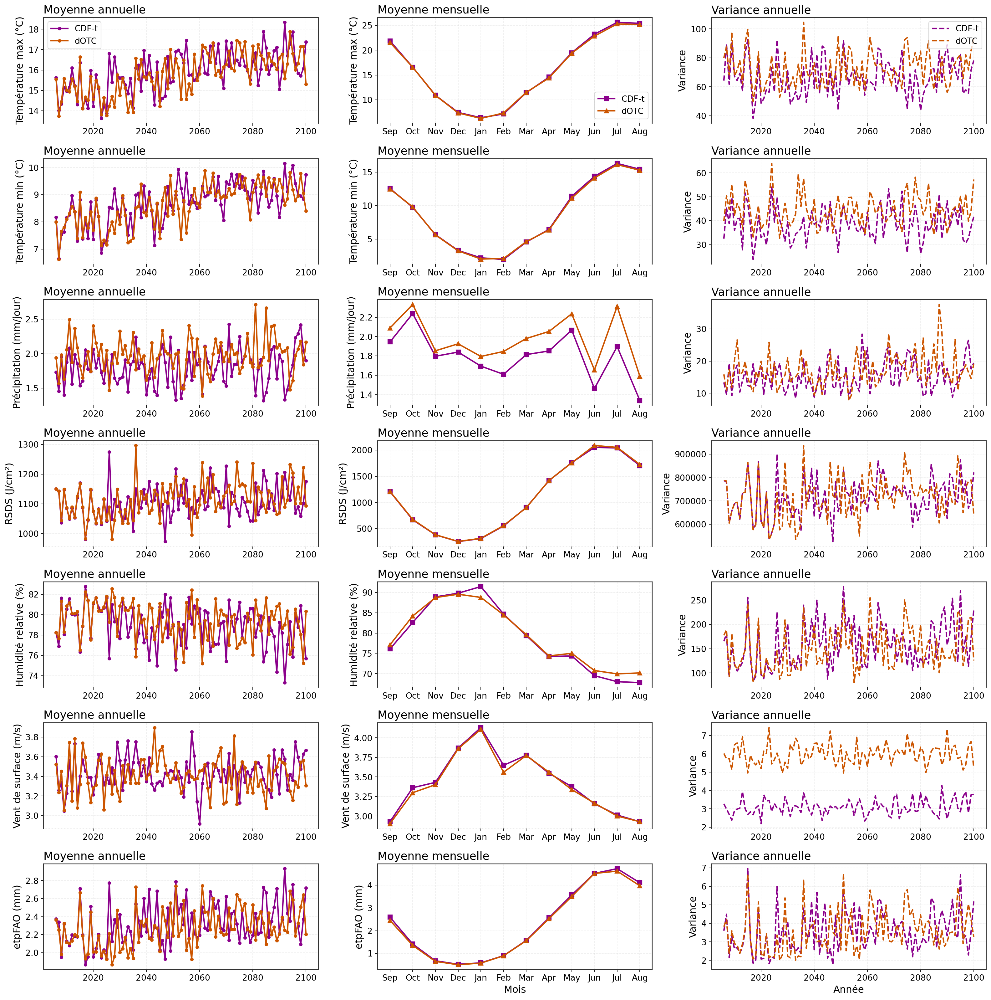

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Style pro
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 16,
    "axes.labelsize": 14,
    "legend.fontsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "#333333",
    "axes.linewidth": 1.1,
    "grid.alpha": 0.2,
    "grid.linestyle": "--"
})

# === Variables et fichiers ===
variables_info = {
    "tasmax": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "tasmax_corr",
        "var_dotc": "tasmax_corr",
        "ylabel": "Température max (°C)"
    },
    "tasmin": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "tasmin_corr",
        "var_dotc": "tasmin_corr",
        "ylabel": "Température min (°C)"
    },
    "pr": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "pr_corr",
        "var_dotc": "pr_corr",
        "ylabel": "Précipitation (mm/jour)"
    },
    "rsds": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "rsds_corr",
        "var_dotc": "rsds_corr",
        "ylabel": "RSDS (J/cm²)"
    },
    "hurs": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "hurs_corr",
        "var_dotc": "hurs_corr",
        "ylabel": "Humidité relative (%)"
    },
    "sfcWind": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "sfcWind_corr",
        "var_dotc": "sfcWind_corr",
        "ylabel": "Vent de surface (m/s)"
    },
    "etpFAO": {
        "cdf_file": "D:/cordex_data/modif1/CDFT_finally_all_vars_1976_2100.csv",
        "var_cdf": "etpFAO_corr",
        "var_dotc": "etpFAO_corr",
        "ylabel": "etpFAO (mm)"    # <-- Ici le nom code comme demandé
    }
}

dotc_file = "D:/cordex_data/modif1/dOTC_final_all_vars_1976_2100.csv"
start_date, end_date = "2006-01-01", "2100-12-31"

df_dotc_all = pd.read_csv(dotc_file, sep=";")
df_dotc_all["date"] = pd.to_datetime(df_dotc_all["date"], errors="coerce")
df_dotc_all["year"] = df_dotc_all["date"].dt.year
df_dotc_all["month"] = df_dotc_all["date"].dt.month

n_vars = len(variables_info)
fig, axes = plt.subplots(n_vars, 3, figsize=(20, 3 * n_vars), dpi=160, constrained_layout=True)
fig.patch.set_facecolor('white')

mois_order = [9,10,11,12,1,2,3,4,5,6,7,8]
mois_labels = ["Sep","Oct","Nov","Dec","Jan","Feb","Mar","Apr","May","Jun","Jul","Aug"]

col_cdf = "#8B008B"
col_dotc = "#cc5500"

for i, (var, info) in enumerate(variables_info.items()):
    print(f"Traitement de la variable : {var}")

    df_cdft = pd.read_csv(info["cdf_file"], sep=";")
    df_dotc = df_dotc_all[["date", info["var_dotc"], "year", "month"]].copy()

    df_cdft["date"] = pd.to_datetime(df_cdft["date"], errors="coerce")
    df_cdft["year"] = df_cdft["date"].dt.year
    df_cdft["month"] = df_cdft["date"].dt.month

    df_cdft = df_cdft[(df_cdft["date"] >= start_date) & (df_cdft["date"] <= end_date)]
    df_dotc = df_dotc[(df_dotc["date"] >= start_date) & (df_dotc["date"] <= end_date)]

    stats_cdft = df_cdft.groupby("year")[info["var_cdf"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_cdft", "var": "var_cdft"})
    stats_dotc = df_dotc.groupby("year")[info["var_dotc"]].agg(["mean", "var"]).reset_index().rename(columns={"mean": "mean_dotc", "var": "var_dotc"})

    mean_cdft = df_cdft.groupby("month")[info["var_cdf"]].mean().reindex(mois_order)
    mean_dotc = df_dotc.groupby("month")[info["var_dotc"]].mean().reindex(mois_order)

    monthly_means = pd.DataFrame({
        "Mois": mois_order,
        "CDF-t": mean_cdft.values,
        "dOTC": mean_dotc.values,
    })

    # Moyenne annuelle
    ax = axes[i, 0]
    ax.plot(stats_cdft["year"], stats_cdft["mean_cdft"], label="CDF-t", linestyle="-", marker="o", markersize=4, linewidth=2, color=col_cdf)
    ax.plot(stats_dotc["year"], stats_dotc["mean_dotc"], label="dOTC", linestyle="-", marker="o", markersize=4, linewidth=2, color=col_dotc)
    ax.set_title(f"Moyenne annuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    ax.grid(True, which='both', linestyle='--', alpha=0.2)
    if i == 0:
        ax.legend(fontsize=12)

    # Moyenne mensuelle
    ax = axes[i, 1]
    ax.plot(mois_labels, monthly_means["CDF-t"], label="CDF-t", marker='s', linestyle='-', linewidth=2, color=col_cdf)
    ax.plot(mois_labels, monthly_means["dOTC"], label="dOTC", marker='^', linestyle='-', linewidth=2, color=col_dotc)
    ax.set_title(f"Moyenne mensuelle", loc='left')
    ax.set_ylabel(info["ylabel"])
    if i == n_vars - 1:
        ax.set_xlabel("Mois")
    if i == 0:
        ax.legend(fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.2)

    # Variance annuelle
    ax = axes[i, 2]
    ax.plot(stats_cdft["year"], stats_cdft["var_cdft"], label="CDF-t", linestyle="--", linewidth=2, color=col_cdf)
    ax.plot(stats_dotc["year"], stats_dotc["var_dotc"], label="dOTC", linestyle="--", linewidth=2, color=col_dotc)
    ax.set_title(f"Variance annuelle", loc='left')
    ax.set_ylabel("Variance")
    if i == n_vars - 1:
        ax.set_xlabel("Année")
    if i == 0:
        ax.legend(fontsize=12)
    ax.grid(True, which='both', linestyle='--', alpha=0.2)

    if i < n_vars - 1:
        for j in range(3):
            axes[i, j].spines['bottom'].set_visible(False)
            axes[i, j].axhline(y=axes[i, j].get_ylim()[0], color="#bbbbbb", linewidth=0.8, alpha=0.7, linestyle=":")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("variances_climatiques_future_dotc.pdf", bbox_inches='tight')
plt.show()

### 5. Validation croisée de la préservation des tendances du modèle

Dans cette section, nous reproduisons une analyse inspirée de la validation croisée proposée dans [Robin et al., 2019](#), afin d’évaluer si l’évolution des données corrigées par CDF-t et dOTC reflète celle du modèle brut ALADIN63 entre deux sous-périodes historiques :  
- **Période d’étalonnage** : 1976–1991  
- **Période de projection** : 1992–2005

Pour chaque variable climatique et chaque site SAFRAN, nous calculons la différence des statistiques (moyenne et variance) entre les deux périodes.

- **Axe des abscisses** : évolution de la correction, calculée comme la différence entre les périodes projetée et d’étalonnage pour la moyenne ($\mathbb{E}(Z^{1}) - \mathbb{E}(Z^{0})$) ou la variance ($\mathbb{V}(Z^{1}) - \mathbb{V}(Z^{0})$).
- **Axe des ordonnées** : évolution correspondante pour le modèle brut ($\mathbb{E}(X^{1}) - \mathbb{E}(X^{0})$ ou $\mathbb{V}(X^{1}) - \mathbb{V}(X^{0})$) en bleu, et pour SAFRAN ($\mathbb{E}(Y^{1}) - \mathbb{E}(Y^{0})$ ou $\mathbb{V}(Y^{1}) - \mathbb{V}(Y^{0})$) en vert.

Une régression linéaire est ensuite ajustée entre l’évolution de la correction (40 sites SAFRAN × variables) et celle du modèle brut.

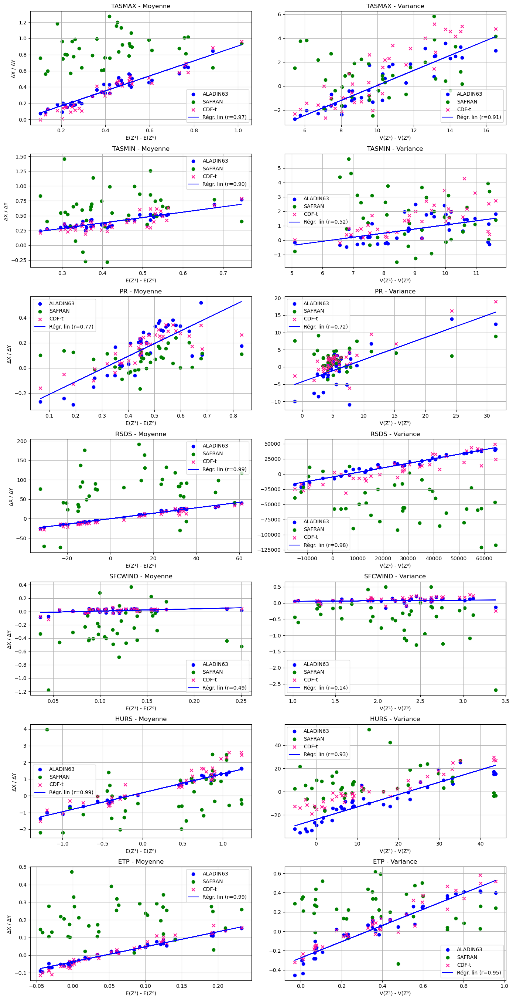

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
import numpy as np

# === Paramètres ===
periode_1 = (1976, 1990)
periode_2 = (1991, 2005)
variables = ["tasmax", "tasmin", "pr", "rsds", "sfcWind", "hurs", "etp"]

# === Dossiers
path_X = "D:/cordex_data/projet_climat/extracted_csv/stations_hist/ALADIN63/"
path_Y = "D:/cordex_data/projet_climat/extracted_csv/stations_SAFRAN/"
path_Z_dOTC = "D:/cordex_data/projet_climat/debiaised/ALADIN-dOTC-CV"
path_Z_CDFT = "D:/cordex_data/projet_climat/debiaised123_crossval"

# === Fonction utilitaire
def extract_stat(df, col, p1, p2):
    df1 = df[df["date"].dt.year.between(*p1)][col]
    df2 = df[df["date"].dt.year.between(*p2)][col]
    return df1.mean(), df2.mean(), df1.var(), df2.var()

# === Préparer la figure finale
n = len(variables)
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(14, 4 * n))
#fig.suptitle("Validation croisée : Moyenne et Variance par variable", fontsize=16)

# === Boucle principale
for i, variable in enumerate(variables):
    mean_data = []
    var_data = []

    for file in os.listdir(path_X):
        if not file.endswith(".csv"):
            continue
        station = file.split("-")[0].replace("stations_hist", "").strip()

        try:
            df_X = pd.read_csv(os.path.join(path_X, file), sep=";", parse_dates=["date"])
            df_Y = pd.read_csv(os.path.join(path_Y, f"{station}_SafranDrias.csv"), sep=";", parse_dates=["date"])

            f_dotc = [f for f in os.listdir(path_Z_dOTC) if f"dOTC_all_vars_{station}_" in f]
            f_cdft = [f for f in os.listdir(path_Z_CDFT) if f"CDFT_all_vars_{station}_" in f]
            if not f_dotc or not f_cdft:
                continue

            df_Z = pd.read_csv(os.path.join(path_Z_dOTC, f_dotc[0]), sep=";", parse_dates=["date"])
            df_C = pd.read_csv(os.path.join(path_Z_CDFT, f_cdft[0]), sep=";", parse_dates=["date"])

            # === Colonnes spécifiques
            if variable == "etp":
                var_obs = "etp"
                var_corr_dotc = "etp_corr"
                var_corr_cdft = "etpFAO_corr"
            else:
                var_obs = variable
                var_corr_dotc = f"{variable}_corr"
                var_corr_cdft = f"{variable}_corr"

            # === Vérification
            colonnes_ok = (
                var_obs in df_X.columns and
                var_obs in df_Y.columns and
                var_corr_dotc in df_Z.columns and
                var_corr_cdft in df_C.columns
            )
            if not colonnes_ok:
                print(f"Colonne manquante pour {station} - {variable}")
                continue

            # === Statistiques
            mx0, mx1, vx0, vx1 = extract_stat(df_X, var_obs, periode_1, periode_2)
            my0, my1, vy0, vy1 = extract_stat(df_Y, var_obs, periode_1, periode_2)
            mz0, mz1, vz0, vz1 = extract_stat(df_Z, var_corr_dotc, periode_1, periode_2)
            mc0, mc1, vc0, vc1 = extract_stat(df_C, var_corr_cdft, periode_1, periode_2)

            mean_data.append({
                "station": station,
                "delta_Z": mz1 - mz0,
                "delta_X": mx1 - mx0,
                "delta_Y": my1 - my0,
                "delta_CDFT": mc1 - mc0
            })
            var_data.append({
                "station": station,
                "delta_Z": vz1 - vz0,
                "delta_X": vx1 - vx0,
                "delta_Y": vy1 - vy0,
                "delta_CDFT": vc1 - vc0
            })

        except Exception as e:
            print(f"Erreur {station} - {variable}: {e}")

    # === Tracer les graphes uniquement si données disponibles
    if not mean_data or not var_data:
        axes[i, 0].set_title(f"{variable.upper()} - Aucune donnée")
        axes[i, 1].set_title(f"{variable.upper()} - Aucune donnée")
        for ax in axes[i]:
            ax.axis("off")
        continue

    # === Moyenne
    df = pd.DataFrame(mean_data)
    slope, intercept, r, p, _ = linregress(df["delta_Z"], df["delta_X"])
    ax_mean = axes[i, 0]
    ax_mean.scatter(df["delta_Z"], df["delta_X"], color='blue', label="ALADIN63")
    ax_mean.scatter(df["delta_Z"], df["delta_Y"], color='green', label="SAFRAN")
    ax_mean.scatter(df["delta_Z"], df["delta_CDFT"], color='deeppink', label="CDF-t", marker='x')
    ax_mean.plot(df["delta_Z"], slope * df["delta_Z"] + intercept, color='blue', linestyle='-', label=f"Régr. lin (r={r:.2f})")
    ax_mean.set_title(f"{variable.upper()} - Moyenne")
    ax_mean.set_xlabel("E(Z¹) - E(Z⁰)")
    ax_mean.set_ylabel("ΔX / ΔY ")
    ax_mean.grid(True)
    ax_mean.legend()

    # === Variance
    df = pd.DataFrame(var_data)
    slope, intercept, r, p, _ = linregress(df["delta_Z"], df["delta_X"])
    ax_var = axes[i, 1]
    ax_var.scatter(df["delta_Z"], df["delta_X"], color='blue', label="ALADIN63")
    ax_var.scatter(df["delta_Z"], df["delta_Y"], color='green', label="SAFRAN")
    ax_var.scatter(df["delta_Z"], df["delta_CDFT"], color='deeppink', label="CDF-t", marker='x')
    ax_var.plot(df["delta_Z"], slope * df["delta_Z"] + intercept, color='blue', label=f"Régr. lin (r={r:.2f})")
    ax_var.set_title(f"{variable.upper()} - Variance")
    ax_var.set_xlabel("V(Z¹) - V(Z⁰)")
    ax_var.grid(True)
    ax_var.legend()

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("val_cross_ALL_VARIABLES00.pdf", format="pdf")

plt.show()


- Ces résultats montrent que les méthodes CDF-t et dOTC permettent de préserver efficacement les tendances du modèle climatique sur les statistiques de premier ordre (moyenne et variance).
- L’évolution observée dans les données SAFRAN diffère notablement de celle du modèle climatique brut, tant pour la moyenne que pour la variance. Cette étude illustre notamment que la correction ne peut être comparée à la référence pendant la période de projection.